In [1]:
from pathlib import Path
import numpy as np
import skimage
import matplotlib.pyplot as plt

In [3]:
#path pointing to the data you which to analyse
data_path = Path.cwd() / "data"

raw_paths = list(data_path.glob("*/Pos*/raw/"))  # path to the raw input images

# run the nucleus segmentation

In [6]:
from pipeline import nuc_segmentation
from pipeline.nuc_segmentation import wavelet_filtering, contrast_adjuster
from pipeline.general_utils import load_sequence

# load some of the data
display_idx = np.random.randint(len(raw_paths))  # get a random index for which folder to displpay
selected_path = Path(raw_paths[display_idx])

# select some images to display
raw_stack = load_sequence.load(selected_path)
indices = np.linspace(0, len(raw_stack)-1, 5, dtype=int)
test_data = [raw_stack[i].copy() for i in indices]

#### Determine the parameters to use

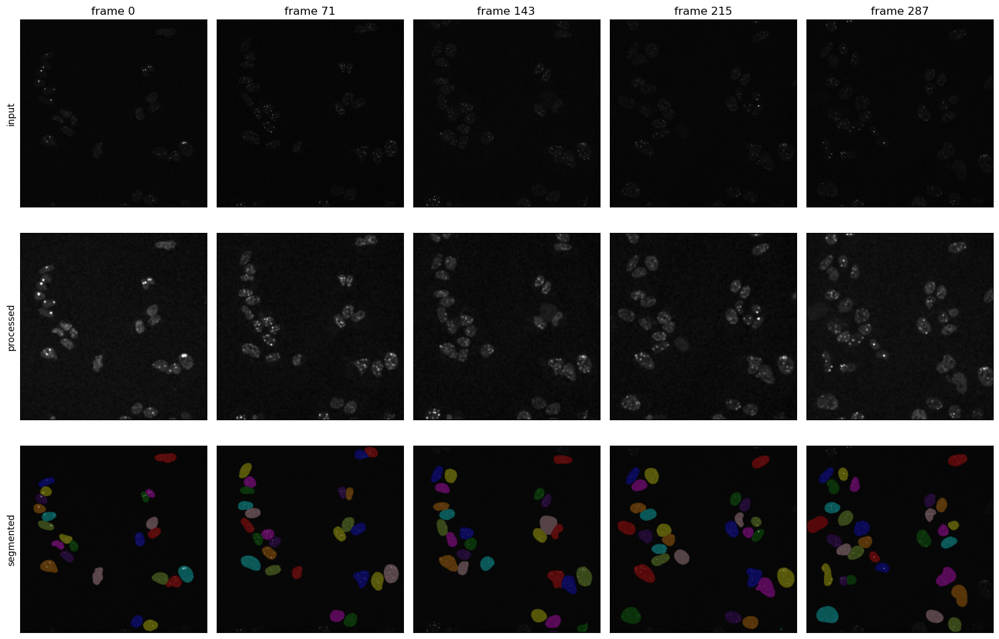

In [7]:
###
# FILL IN THE USER OPTIONS BELOW
###

processing_method = contrast_adjuster  # select from contrast_adjuster, wavelet_filtering or None

# user inputs for the contrast adjusting
sigma = 3.0  # Gaussian blurring factor
c_factor = 6.0  # factor for clipping the signal, decrease to clip lower intensities

# user inputs for the wavelet filtering
scales = 5  # integer: number of scales to use
w_factor = 1.5  # factor to discard wavelet coefficients
start_scale = 2  # integer: first scale to use in the reconstruction


# user inputs for cellpose-SAM segmentation
flow_T = 0.0  # threshold for the flow field
prob_T = -0.5  # threshold for cell detection probability
scale_factor=1/2  # scaling factor to make sure nuclei are within 7.5 to 120 pixels in size


###
# END OF USER OPTIONS
###

processed =  nuc_segmentation.preprocessing(test_data, processing_method, 
                                            scales=scales,  w_factor=w_factor, start_scale=start_scale,
                                           sigma=sigma, c_factor=c_factor)

# code to run the segmentation
method =  nuc_segmentation.CP_SAM(flow_threshold=flow_T, cellprob_threshold=prob_T, scale_factor=scale_factor)
# uncomment the line below if you would like to use cellpose V3 instead of cellpose SAM
#method =  nuc_segmentation.CP_V3(flow_threshold=0.0, cellprob_threshold=-1.0, diameter=140)

# run the segmentation on the processed data
preds =  nuc_segmentation.segment_imglist(processed, method)

# make the plot to display the output
fig, ax = plt.subplots(nrows=3, ncols=len(test_data), figsize=(15,10))
for ii in range(len(test_data)):
    ax[0,ii].imshow(test_data[ii], cmap='gray')
    ax[1,ii].imshow(processed[ii], cmap='gray')
    to_display = skimage.color.label2rgb(preds[ii], test_data[ii], bg_label=0)
    ax[2,ii].imshow(to_display, cmap='gray')

    ax[0,ii].set_title(f"frame {indices[ii]}")
ax[0,0].set_ylabel("input")
ax[1,0].set_ylabel("processed")
ax[2,0].set_ylabel("segmented")

for axx in ax.flat:
    axx.set_xticks([])
    axx.set_yticks([])
fig.tight_layout()

#### run with specified parameters on all images

the output will be saved in 'results/results_cell_seg'

In [8]:
nuc_segmentation.segment_folderlist(raw_paths, method, processing_method, 
                                    scales=scales,  w_factor=w_factor, start_scale=start_scale,
                                    sigma=sigma, c_factor=c_factor)

processing: C:\Users\084011\Documents\projects\live_cell_foci_analysis\data\20241120_Xray_25_Gy\Pos2\raw


# run the nucleus tracking

In [9]:
from pipeline import nuclei_trackers
from pipeline.general_utils import plt_figures
from IPython.display import HTML, display
import base64

seg_paths = list(data_path.glob("*/Pos*/results/result_cell_seg"))  

# select one of paths to display
display_idx = np.random.randint(len(seg_paths))  # get a random index for which folder to displpay
test_path = seg_paths[display_idx]

#### determine parameters to use

In [10]:
###
# FILL IN THE USER OPTIONS BELOW
###

tracking_method='NDD'  # select from 'IOU', 'NDD' or 'trackastra'
min_length = 20  # minimum length of the tracks

# user inputs IOU tracker
iou_min = 0.01  # the minimum overlap required before considering it to be linked. Adviced to keep it at 0.01

# user inputs NDD tracker
max_distance = 30.0
gap_closing = 0  # integer, connect nuclei with missing detections. Adviced to keep it at 0

# user inputs trackastra tracker
remove_gaps = True  # True or False, when True splits tracks into separate gaps whenever there is a missing detections. Adviced to set to True

###
# END OF USER OPTIONS
###

nuclei_trackers.run_tracker([test_path], method=tracking_method, min_length=min_length, 
                            iou_min=iou_min,
                            max_distance=max_distance, gap_closing=gap_closing,
                            remove_gaps=remove_gaps)


# make a movie and display the results
print("tracking finished. Continue to make a movie for displaying")

plt_figures.animate_from_masks(test_path.parent, dpi=120, vmax=150)
with open(test_path.parent / "cell_tracking" / "tracking.mp4", "rb") as f:
    video_bytes = f.read()
video_b64 = base64.b64encode(video_bytes).decode()

display(HTML(f"""
<video width="700" controls>
    <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
</video>
"""))


Number of given parameters:3
----------------------------------------------------------------------------------------------------
 ... Nearest Neighbor with Diffusion model, started on 2026-03-12 10:36:09
 ... getting detections from : C:\Users\084011\Documents\projects\live_cell_foci_analysis\data\20241120_Xray_25_Gy\Pos2\results\cell_tracking\temp_files\detections.xml.txt
***********************************************************************************************************************************************************************************************************************************************************************************************
 ... found 35 tracks ... tracking is finished in 0.043 sec.
 ... saving results for scenario:MICROTUBULES density:LOW SNR:10
----------------------------------------------------------------------------------------------------

tracking finished. Continue to make a movie for displaying


#### run with specified parameters on all data

In [11]:
nuclei_trackers.run_tracker(seg_paths, method=tracking_method, min_length=min_length, 
                            iou_min=iou_min,
                            max_distance=max_distance, gap_closing=gap_closing,
                            remove_gaps=remove_gaps)


Number of given parameters:3
----------------------------------------------------------------------------------------------------
 ... Nearest Neighbor with Diffusion model, started on 2026-03-12 10:37:25
 ... getting detections from : C:\Users\084011\Documents\projects\live_cell_foci_analysis\data\20241120_Xray_25_Gy\Pos2\results\cell_tracking\temp_files\detections.xml.txt
***********************************************************************************************************************************************************************************************************************************************************************************************
 ... found 35 tracks ... tracking is finished in 0.04 sec.
 ... saving results for scenario:MICROTUBULES density:LOW SNR:10
----------------------------------------------------------------------------------------------------



# crop out the tracked nuclei to isolate them

In [12]:
from pipeline import cut_out_cells

pos_paths = list(Path(data_path).glob("*/Pos*"))  # path to the raw input images
      
for pp in pos_paths:
    cut_out_cells.cut_from_ctc(pp)

# run the registration

In [12]:
from pipeline import registration
from pipeline.registration import wavelet_denoise, threshold, DOG_filter

followed_paths = list(data_path.glob("*/Pos*/results/followed/*/*.tif"))  

# select one of paths to display
display_idx = np.random.randint(len(followed_paths))  # get a random index for which folder to displpay
test_stack = skimage.io.imread(followed_paths[display_idx])

#### Determine parameters to use

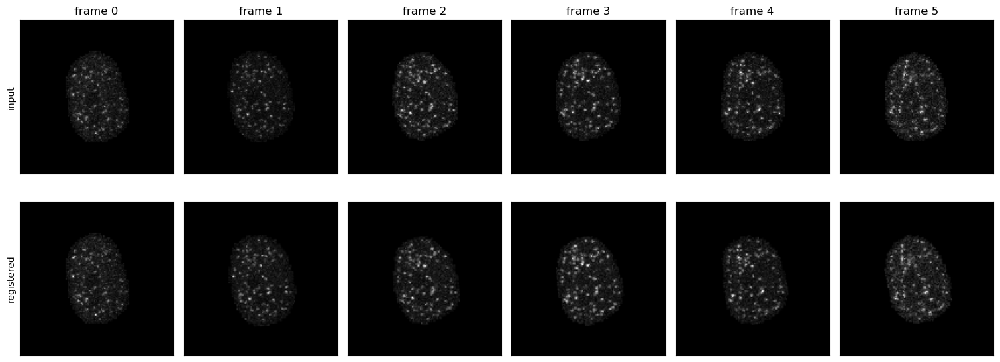

In [13]:
###
# FILL IN THE USER OPTIONS BELOW
###

registration_method='stackreg'  # select from 'stackreg', or 'elastix'

proc_function = None   # preprocessing function select from None, wavelet_denoise, threshold or DOG_filter

# user inputs for elastix
loss = 'MSE' # select from 'MSE' for mean squared error, 'MI' for mutual information or NCC for normalised cross corelation

###
# END OF USER OPTIONS
###

reg_result = registration.register_array(test_stack, method=registration_method, preprocess_function=proc_function, loss=loss)


# make the plot to display the output
num_images = 6
fig, ax = plt.subplots(nrows=2, ncols=num_images, figsize=(15,5.5))
for ii in range(num_images):
    ax[0,ii].imshow(test_stack[ii], cmap='gray')
    ax[1,ii].imshow(reg_result[ii], cmap='gray')

    ax[0,ii].set_title(f"frame {ii}")
ax[0,0].set_ylabel("input")
ax[1,0].set_ylabel("registered")

for axx in ax.flat:
    axx.set_xticks([])
    axx.set_yticks([])
fig.tight_layout()

#### run with specified parameters on all data

In [14]:
registration.run_registration(followed_paths, method=registration_method, preprocess_function=proc_function, loss=loss)

running stackreg registration without preprocessing


# run the foci detection

In [75]:
from pipeline import foci_detection


registered_paths = list(data_path.glob("*/Pos*/results/registered/*/*.tif"))  

# select one of paths to display
display_idx = np.random.randint(len(registered_paths), size=4)  # get 5 random indexes for cells to displpay

# randomly load some of the images of different cells. Note that these can have different sizes
test_frames = []
for idx in display_idx:    
    test_stack = skimage.io.imread(registered_paths[idx])
    frame = test_stack[np.random.randint(test_stack.shape[0])]
    test_frames.append(frame)  

#### determine parameters to use

INFO:spotiflow.model.spotiflow:Loading pretrained model: general


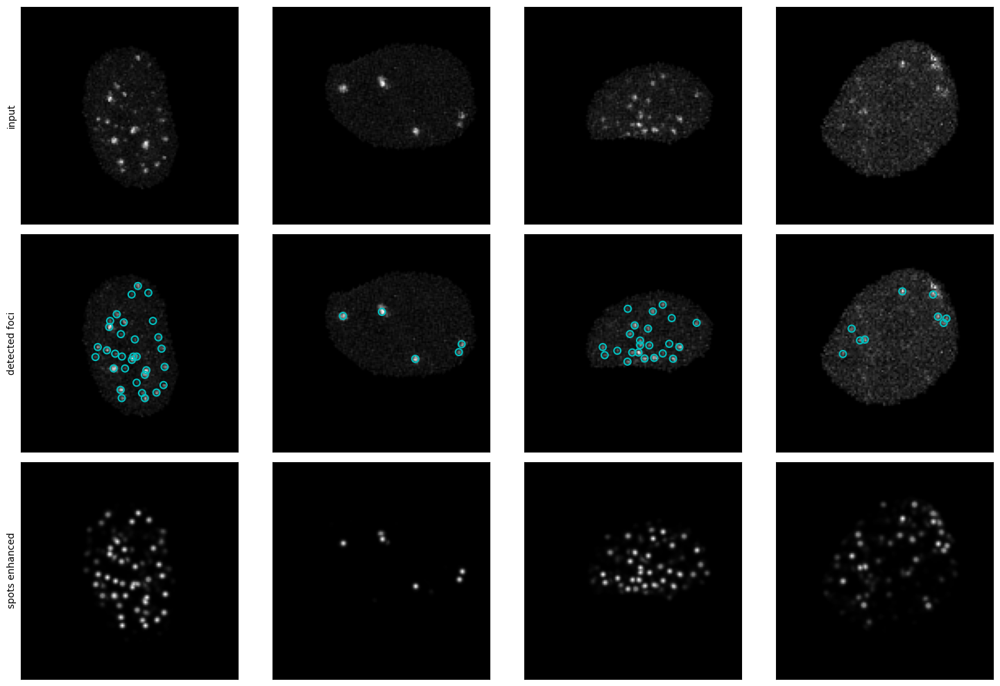

In [83]:
###
# FILL IN THE USER OPTIONS BELOW
###

# specify the detector. Pick from "Wavelets", "LOG", "Hessian", "TopHat", "HDome", "HDome-smal", "MPHD" or "Spotiflow" 
method = 'Spotiflow' 

# below you can change the parameters associated with each detector by changing their value
DETECTOR_REGISTRY = {
    "Wavelets": {
        "chosen_params": {
            "K": 3,  # number of wavelet scales
            "factor": 4.0,  # factor used to remove coefficients
            "start_scale": 0  # first scale used in the reconstruction
        },
        "chosen_threshold": 30  # threshold for detecting maxima
    },
    "LOG": {
        "chosen_params": {
            "sigma": 0.8  # std used for the Gaussian smoothing
        },
        "chosen_threshold": 26  # threshold for detecting maxima
    },
    "Hessian": {
        "chosen_params": {
            "sigma": 0.5  # std used for the Gaussian smoothing
        },
        "chosen_threshold": 5  # threshold for detecting maxima
    },
    "TopHat": {
        "chosen_params": {
            "sigma": 0.6,  # std used for the Gaussian smoothing
            "radius": 2.0  # radius of the disk shaped structering element, should match the size of your objects in pixels
        },
        "chosen_threshold": 26  # threshold for detecting maxima
    },
    "HDome": {
        "chosen_params": {
            "h": 50  # height of the used h dome
        },
        "chosen_threshold": 40  # threshold for detecting maxima
    },
    "HDome-smal": {
        "chosen_params": {
            "sigma": 1.2,  # sigma used in the LOG filter step
            "h": 80,  # height of the used h dome
            "s": 1.5  # exponent used on the output image to narrow peaks
        },
        "chosen_threshold": 20  # threshold for detecting maxima
    },
    "MPHD": {
        "chosen_params": {
            "sigma": 0.5,  # std used for the Gaussian smoothing
            "h_init": 5,  # initial h dome value to use
            "R": 10  # integer, search radius around each local maxima 
        },
        "chosen_threshold": 20  # threshold for detecting maxima
    },
    "Spotiflow": {
        "chosen_params": {
            "model_name": "general"  # only change this if your trained your own model
        },
        "chosen_threshold": 0.55  # threshold for detecting maxima between 0 and 1
    }
}

###
# END OF USER OPTIONS
###


detector, threshold = foci_detection.create_detector(method, params=DETECTOR_REGISTRY[method]["chosen_params"],
                                                    threshold=DETECTOR_REGISTRY[method]["chosen_threshold"])
results = [foci_detection.run_detector_stack([frame], detector, threshold, return_segmentation=False) for frame in test_frames]
detections = [r[0][0] for r in results]
enhanced = [r[1][0] for r in results]

# make the plot to display the output
fig, ax = plt.subplots(nrows=3, ncols=len(test_frames), figsize=(15,10))
for idx in range(len(test_frames)):
    ax[0,idx].imshow(test_frames[idx], cmap='gray')
    
    ax[1,idx].imshow(test_frames[idx], cmap='gray')
    ax[1,idx].scatter(detections[idx][:,0], detections[idx][:,1], facecolors='none', edgecolors='c', s=50, linewidths=1.5)

    ax[2,idx].imshow(enhanced[idx], cmap='gray')

ax[0,0].set_ylabel("input")
ax[1,0].set_ylabel("detected foci")
ax[2,0].set_ylabel("spots enhanced")

for axx in ax.flat:
    axx.set_xticks([])
    axx.set_yticks([])
fig.tight_layout()

#### run with specified parameters on all data

In [86]:
foci_detection.run_detection(registered_paths, detector, threshold, return_segmentation=True)

# run the foci tracking

In [87]:
from pipeline import foci_trackers
from pipeline.general_utils import plt_figures
from IPython.display import HTML, display
import base64

display_idx = np.random.randint(len(registered_paths))  # get a random index for which folder to displpay
disp_path = registered_paths[display_idx]

#### determine parameters to use

In [113]:
###
# FILL IN THE USER OPTIONS BELOW
###

tracking_method = 'NGMA'  # select from 'GNN', 'NGMA', or 'trackastra'

# user input for all of the tracking algorithms
min_track_length = 3  # integer, minimum required length for the tracks in frames

# user inputs for GNN and NGMA
max_distance = 4.0  # the maximum allowed distance for linking detections in pixels
gap_closing = 4  #  number of frames to close between tracks when detections are missing

# user inputs for trackastra
use_segmentations = True  # True for using the segmented objects to calculate features and False for using detected coordinates only

###
# END OF USER OPTIONS
###


foci_trackers.run_foci_tracker([disp_path], method=tracking_method, min_track_length=min_track_length, 
                               max_distance=max_distance, gap_closing=gap_closing,
                               use_segmentation=use_segmentations)

# make a movie and display the results
print("tracking finished. Continue to make a movie for displaying")

plt_figures.animate_from_xml(disp_path, dpi=240, interval=20, fps=7, lw=1.0, ms=1.0)
with open(disp_path.parent / "tracking_movie.mp4", "rb") as f:
    video_bytes = f.read()
video_b64 = base64.b64encode(video_bytes).decode()

display(HTML(f"""
<video width="700" controls>
    <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
</video>
"""))


Number of given parameters:3
C:\Users\084011\Documents\projects\live_cell_foci_analysis\data\20241120_Xray_25_Gy\Pos2\results\registered\I_V9X5\detections.xml.txt
----------------------------------------------------------------------------------------------------
 ... Noniterative Gready Multi-frame Assignment started on 2026-03-10 13:02:59
 ... motion model in use : 2
 ... buffer size is : 6
************************************************************************************************************************************************************************************************************************************************************************************************
 ... found 209 tracks ... tracking is finished in 0.12 sec. or 0.00 min.
 ... saving results for scenario:MICROTUBULES density:LOW SNR:10
----------------------------------------------------------------------------------------------------

tracking finished. Continue to make a movie for displaying


#### run with the specified parameters on all data

In [ ]:
foci_trackers.run_foci_tracker(registered_paths, method=tracking_method, min_track_length=min_track_length, 
                               max_distance=max_distance, gap_closing=gap_closing,
                               use_segmentation=use_segmentations)